In [241]:
#initialization
from datetime import datetime
import calendar
import numpy as np
import pandas as pd
import seaborn as sns
import datetime as timedelta
from pandas import set_option
from numpy import arange
#from matplotlib import pyplot
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn import feature_selection
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_absolute_error

In [242]:
#setup the layout for the figures
%matplotlib inline
from pylab import rcParams
rcParams['figure.figsize'] = 20, 8
plt.tight_layout()

<Figure size 1440x576 with 0 Axes>

In [243]:
#Read Dataset
df_ori = pd.read_csv('SharingSession.csv', encoding="ISO-8859-1", 
                     parse_dates=['Date'], index_col=['Date'], dayfirst=True)

In [244]:
df=df_ori.copy()
df.dropna(inplace=True)
#replace space to _ on column's name
df.columns = df.columns.str.replace(' ','_')
df.drop(['Hippophae','Ligustrum','Ranunculaceae','Fabaceae'], inplace=True, axis=1)

In [245]:
df.columns.values

array(['GP_ArrivalPatient', 'C_Consult', 'C_overig', 'C_Telefonisch',
       'C_Visite', 'GP_Post_Age_0-4_year', 'GP_Post_Age_5-19_year',
       'GP_Post_Age_20-65_year', 'GP_Post_Age_66-74_year',
       'GP_Post_Age_75_plus', 'U0', 'U1', 'U2', 'U3', 'U4', 'U5',
       'ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
       'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
       'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
       'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
       'ICPCcode_Z', 'W_DDVEC', 'W_FHVEC', 'W_FG', 'W_FHX', 'W_FHXH',
       'W_FHN', 'W_FHNH', 'W_FXX', 'W_FXXH', 'W_TG', 'W_TN', 'W_TNH',
       'W_TX', 'W_TXH', 'W_T10N', 'W_T10NH', 'W_SQ', 'W_SP', 'W_Q',
       'W_DR', 'W_RH', 'W_RHX', 'W_RHXH', 'W_UG', 'W_UX', 'W_UXH', 'W_UN',
       'W_UNH', 'W_EV24', 'Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
       'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
       'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 

In [246]:
df.head(5)

,GP_ArrivalPatient,C_Consult,C_overig,C_Telefonisch,C_Visite,GP_Post_Age_0-4_year,GP_Post_Age_5-19_year,GP_Post_Age_20-65_year,GP_Post_Age_66-74_year,GP_Post_Age_75_plus,...,ED_Urgency_Oranje,ED_Urgency_Overig,ED_Urgency_Rood,Is_Holiday,Is_Weekday,Is_Summer,Is_Autumn,Is_Winter,Is_Spring,GP_Post_WH_Opening
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,149,95,0,42,12,26,29,67,8,16,...,6,3,1,1,1,0,0,1,0,1
2013-01-02,44,18,0,23,3,6,4,24,1,9,...,6,2,0,0,1,0,0,1,0,0
2013-01-03,41,20,0,15,6,6,8,20,1,6,...,6,1,0,0,1,0,0,1,0,0
2013-01-04,61,27,0,25,9,7,4,29,1,20,...,3,3,0,0,1,0,0,1,0,0
2013-01-05,197,96,0,75,26,24,27,87,21,37,...,6,1,0,0,0,0,0,1,0,0


In [247]:
df.tail(5)

,GP_ArrivalPatient,C_Consult,C_overig,C_Telefonisch,C_Visite,GP_Post_Age_0-4_year,GP_Post_Age_5-19_year,GP_Post_Age_20-65_year,GP_Post_Age_66-74_year,GP_Post_Age_75_plus,...,ED_Urgency_Oranje,ED_Urgency_Overig,ED_Urgency_Rood,Is_Holiday,Is_Weekday,Is_Summer,Is_Autumn,Is_Winter,Is_Spring,GP_Post_WH_Opening
Date,,,,,,,,,,,,,,,,,,,,,
2017-12-27,65,30,0,26,9,8,6,37,3,11,...,2,0,0,0,1,0,0,1,0,0
2017-12-28,58,29,0,21,8,11,11,24,3,9,...,6,0,1,0,1,0,0,1,0,0
2017-12-29,30,8,0,17,5,5,3,14,1,7,...,4,1,0,0,1,0,0,1,0,0
2017-12-30,197,97,0,86,14,29,21,96,20,31,...,8,0,0,0,0,0,0,1,0,0
2017-12-31,204,101,0,81,22,17,24,90,36,37,...,7,2,0,1,0,0,0,1,0,1


In [248]:
df.describe()

,GP_ArrivalPatient,C_Consult,C_overig,C_Telefonisch,C_Visite,GP_Post_Age_0-4_year,GP_Post_Age_5-19_year,GP_Post_Age_20-65_year,GP_Post_Age_66-74_year,GP_Post_Age_75_plus,...,ED_Urgency_Oranje,ED_Urgency_Overig,ED_Urgency_Rood,Is_Holiday,Is_Weekday,Is_Summer,Is_Autumn,Is_Winter,Is_Spring,GP_Post_WH_Opening
count,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,...,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000
mean,81.996166,42.376780,0.129244,31.019168,8.470975,9.503834,13.638007,37.421687,7.436473,13.801205,...,5.907996,0.759036,0.207010,0.035049,0.714129,0.251917,0.249179,0.246988,0.251917,0.027382
std,57.949657,33.207136,0.428760,20.244970,6.276416,7.199409,9.850491,27.403542,6.458683,10.623077,...,2.564301,1.005730,0.469188,0.183955,0.451952,0.434233,0.432656,0.431378,0.434233,0.163239
min,18.000000,6.000000,0.000000,4.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,42.000000,19.000000,0.000000,17.000000,4.000000,4.000000,7.000000,18.000000,3.000000,6.000000,...,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,50.000000,24.000000,0.000000,22.000000,6.000000,7.000000,10.000000,23.000000,5.000000,9.000000,...,6.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,143.000000,78.000000,0.000000,46.000000,12.000000,14.000000,20.000000,64.000000,11.000000,22.000000,...,7.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
max,262.000000,138.000000,6.000000,113.000000,33.000000,42.000000,54.000000,137.000000,36.000000,59.000000,...,16.000000,7.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [249]:
df[['GP_ArrivalPatient', 'C_Consult', 'C_overig', 'C_Telefonisch',
       'C_Visite', 'GP_Post_Age_0-4_year', 'GP_Post_Age_5-19_year']].describe()

,GP_ArrivalPatient,C_Consult,C_overig,C_Telefonisch,C_Visite,GP_Post_Age_0-4_year,GP_Post_Age_5-19_year
count,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000
mean,81.996166,42.376780,0.129244,31.019168,8.470975,9.503834,13.638007
std,57.949657,33.207136,0.428760,20.244970,6.276416,7.199409,9.850491
min,18.000000,6.000000,0.000000,4.000000,0.000000,0.000000,0.000000
25%,42.000000,19.000000,0.000000,17.000000,4.000000,4.000000,7.000000
50%,50.000000,24.000000,0.000000,22.000000,6.000000,7.000000,10.000000
75%,143.000000,78.000000,0.000000,46.000000,12.000000,14.000000,20.000000
max,262.000000,138.000000,6.000000,113.000000,33.000000,42.000000,54.000000


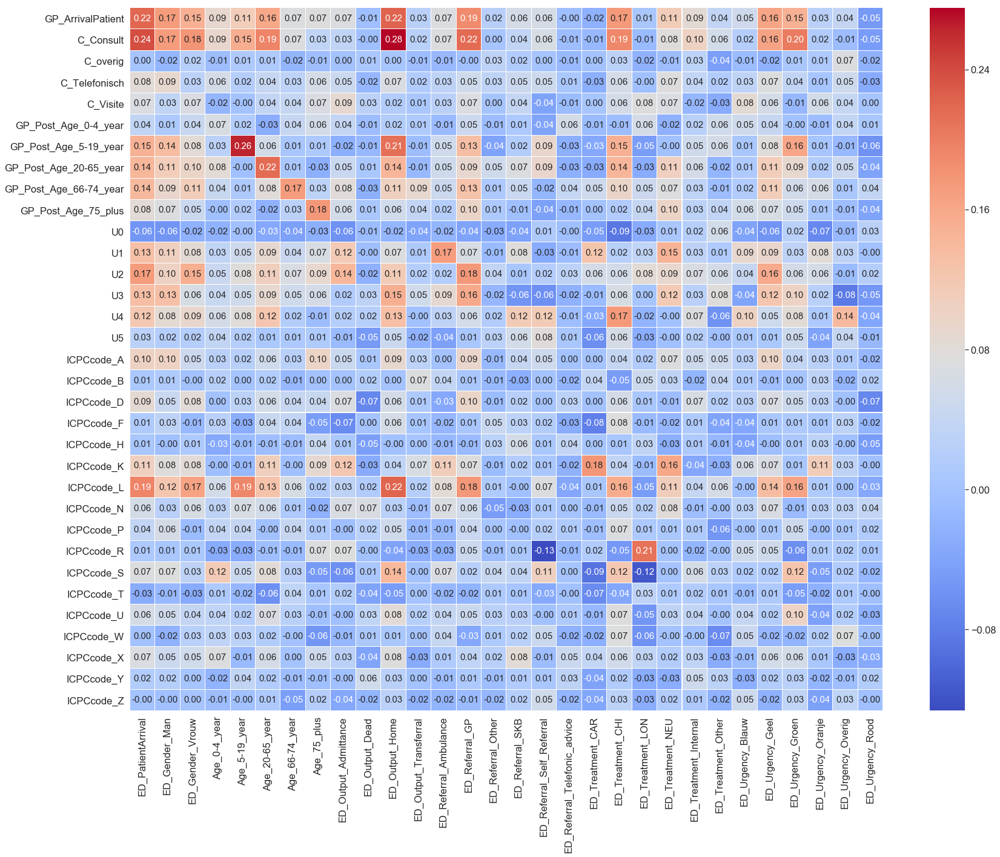

In [250]:
#Correlation GP-Post Vs ED Weekdays
fig, (ax) = plt.subplots(1, 1, figsize=(25,20))
sns.set(font_scale=1.5)
hm = sns.heatmap(df[(df['Is_Weekday']==1) & (df['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient', 'C_Consult', 'C_overig', 'C_Telefonisch',
                                                                               'C_Visite', 'GP_Post_Age_0-4_year', 'GP_Post_Age_5-19_year',
                                                                               'GP_Post_Age_20-65_year', 'GP_Post_Age_66-74_year',
                                                                               'GP_Post_Age_75_plus', 'U0', 'U1', 'U2', 'U3', 'U4', 'U5',
                                                                               'ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                                                                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                                                                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                                                                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                                                                               'ICPCcode_Z'],
                                                                              ['ED_PatientArrival',
                                                                               'ED_Gender_Man', 'ED_Gender_Vrouw', 'Age_0-4_year',
                                                                               'Age_5-19_year', 'Age_20-65_year', 'Age_66-74_year', 'Age_75_plus',
                                                                               'ED_Output_Admittance', 'ED_Output_Dead', 'ED_Output_Home',
                                                                               'ED_Output_Transferral', 'ED_Referral_Ambulance', 'ED_Referral_GP',
                                                                               'ED_Referral_Other', 'ED_Referral_SKB',
                                                                               'ED_Referral_Self_Referral', 'ED_Referral_Telefonic_advice',
                                                                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                                                                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other',
                                                                               'ED_Urgency_Blauw', 'ED_Urgency_Geel', 'ED_Urgency_Groen',
                                                                               'ED_Urgency_Oranje', 'ED_Urgency_Overig', 'ED_Urgency_Rood']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

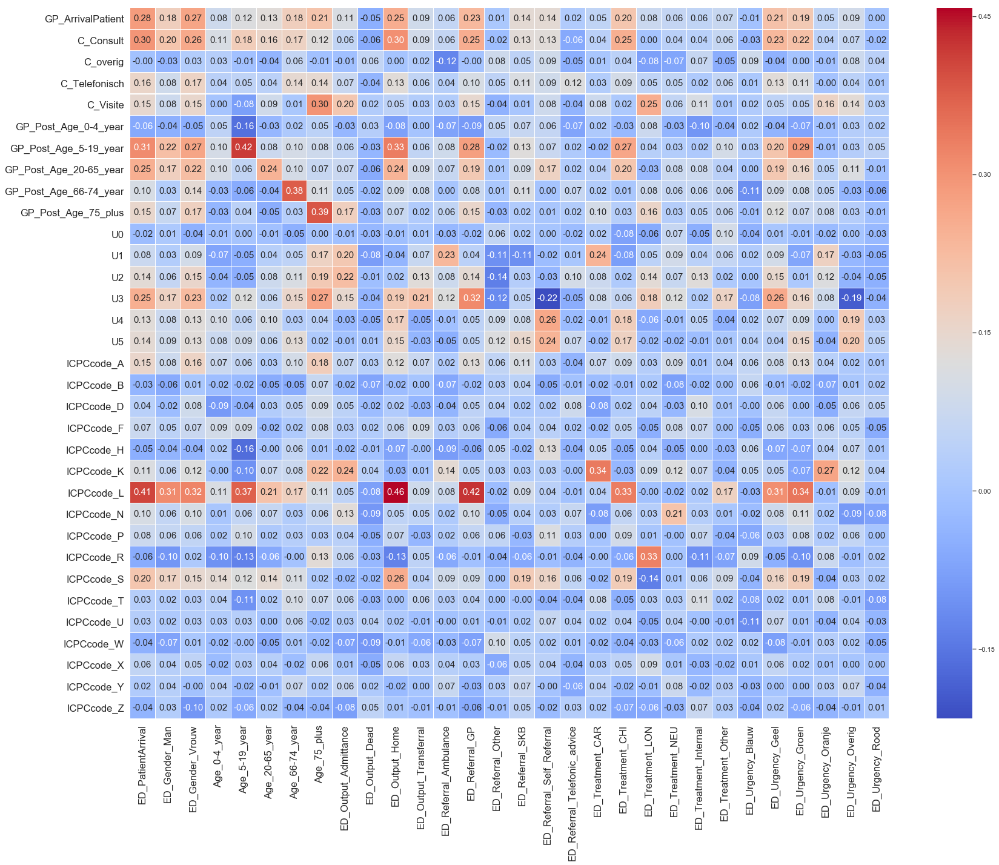

In [251]:
#Correlation GP-Post Vs ED Weekends
fig, (ax) = plt.subplots(1, 1, figsize=(25,20))
sns.set(font_scale=1.0)
hm = sns.heatmap(df[(df['Is_Weekday']==0) & (df['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient', 'C_Consult', 'C_overig', 'C_Telefonisch',
                                                                               'C_Visite', 'GP_Post_Age_0-4_year', 'GP_Post_Age_5-19_year',
                                                                               'GP_Post_Age_20-65_year', 'GP_Post_Age_66-74_year',
                                                                               'GP_Post_Age_75_plus', 'U0', 'U1', 'U2', 'U3', 'U4', 'U5',
                                                                               'ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                                                                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                                                                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                                                                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                                                                               'ICPCcode_Z'],
                                                                              ['ED_PatientArrival',
                                                                               'ED_Gender_Man', 'ED_Gender_Vrouw', 'Age_0-4_year',
                                                                               'Age_5-19_year', 'Age_20-65_year', 'Age_66-74_year', 'Age_75_plus',
                                                                               'ED_Output_Admittance', 'ED_Output_Dead', 'ED_Output_Home',
                                                                               'ED_Output_Transferral', 'ED_Referral_Ambulance', 'ED_Referral_GP',
                                                                               'ED_Referral_Other', 'ED_Referral_SKB',
                                                                               'ED_Referral_Self_Referral', 'ED_Referral_Telefonic_advice',
                                                                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                                                                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other',
                                                                               'ED_Urgency_Blauw', 'ED_Urgency_Geel', 'ED_Urgency_Groen',
                                                                               'ED_Urgency_Oranje', 'ED_Urgency_Overig', 'ED_Urgency_Rood']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

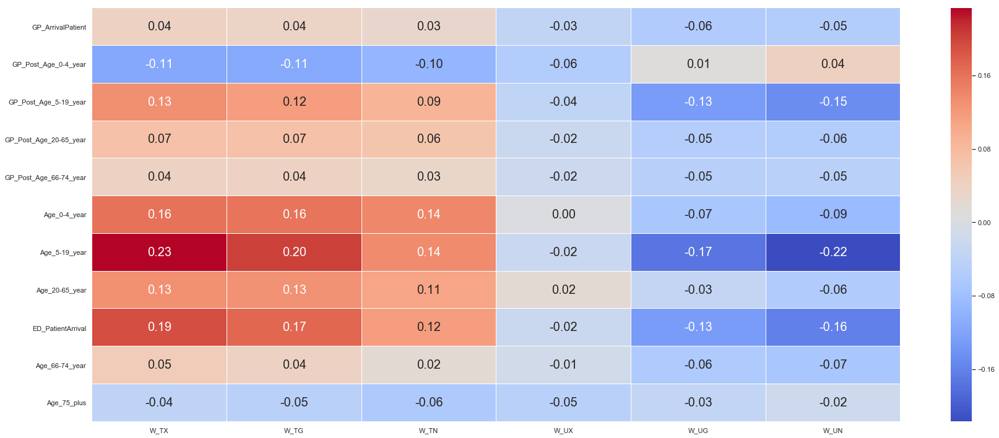

In [252]:
#Correlation for All dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))

hm = sns.heatmap(df.corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 'GP_Post_Age_66-74_year', 
                                'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 20},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

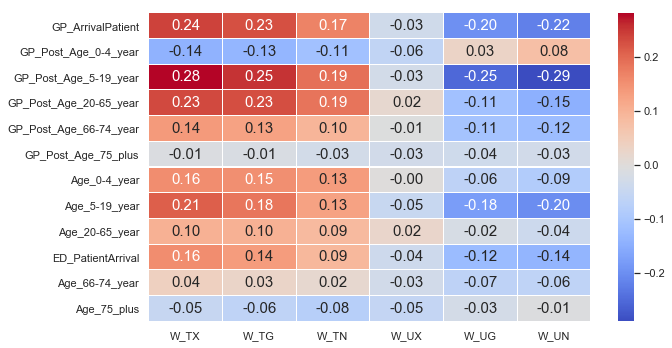

In [253]:
#Correlation for only weekday and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df[(df['Is_Weekday']==1) & (df['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

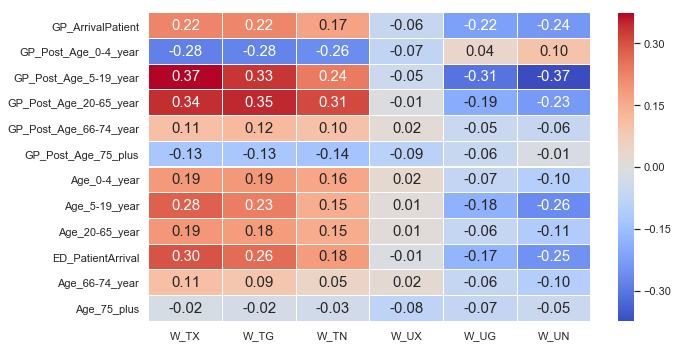

In [254]:
#Correlation for only weekend and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df[(df['Is_Weekday']==0) & (df['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

In [255]:
df_summer = df[(df.index.month==6)|(df.index.month==7)|(df.index.month==8)].copy()
df_autumn = df[(df.index.month==9)|(df.index.month==10)|(df.index.month==11)].copy()
df_winter = df[(df.index.month==12)|(df.index.month==1)|(df.index.month==2)].copy()
df_spring = df[(df.index.month==3)|(df.index.month==4)|(df.index.month==5)].copy()

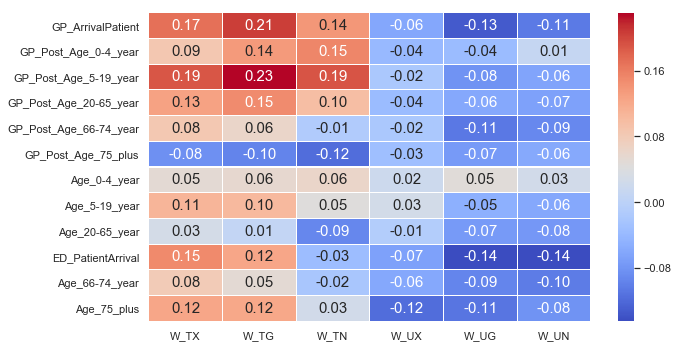

In [256]:
#Correlation for only weekday and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df_summer[(df_summer['Is_Weekday']==1) & (df_summer['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

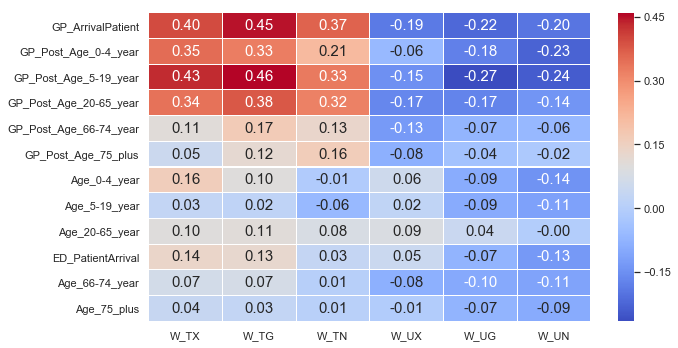

In [257]:
#Correlation for only weekend and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df_summer[(df_summer['Is_Weekday']==0) & (df_summer['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

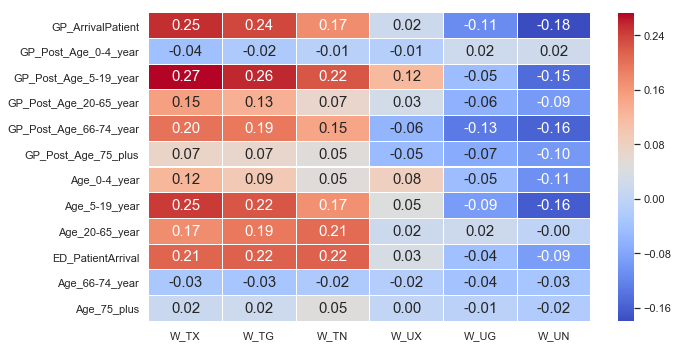

In [258]:
#Correlation for only weekday and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df_autumn[(df_autumn['Is_Weekday']==1) & (df_autumn['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

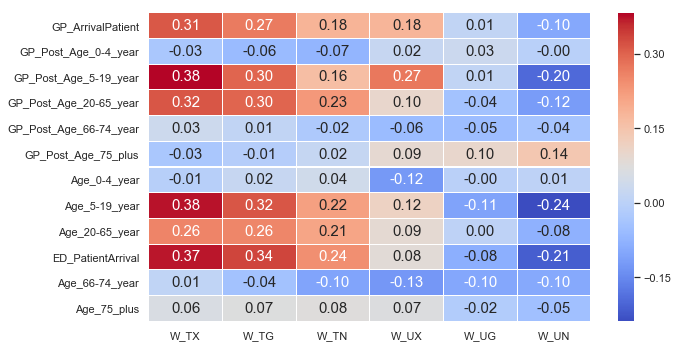

In [259]:
#Correlation for only weekend and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df_autumn[(df_autumn['Is_Weekday']==0) & (df_autumn['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

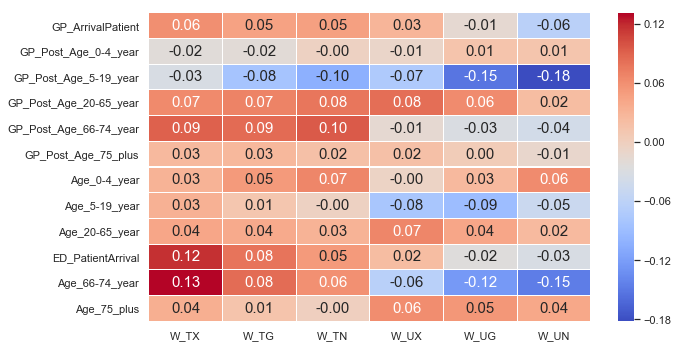

In [260]:
#Correlation for only weekday and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df_winter[(df_winter['Is_Weekday']==1) & (df_winter['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

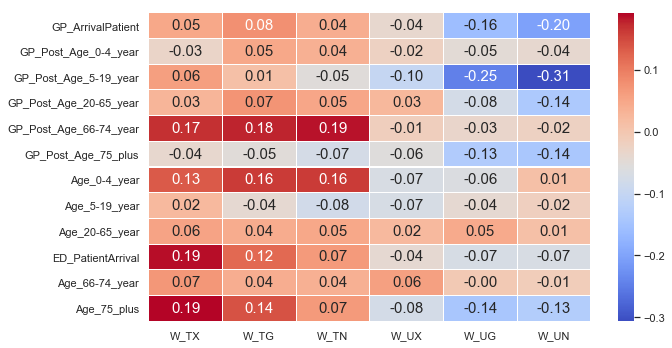

In [261]:
#Correlation for only weekend and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df_winter[(df_winter['Is_Weekday']==0) & (df_winter['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

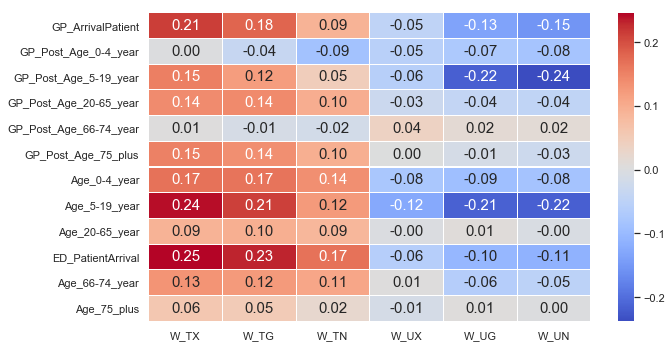

In [262]:
#Correlation for only weekday and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df_spring[(df_spring['Is_Weekday']==1) & (df_spring['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

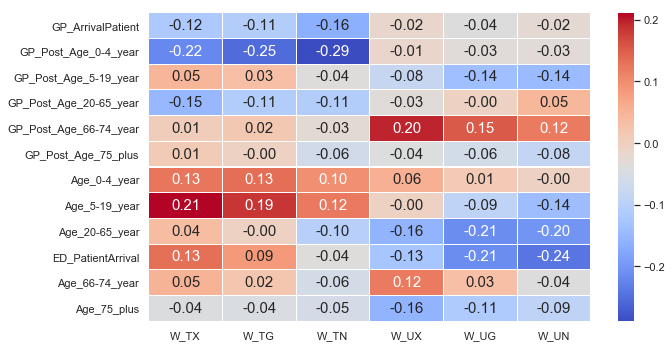

In [263]:
#Correlation for only weekend and Non-Holiday dates 
fig, (ax) = plt.subplots(1, 1, figsize=(10,5))
sns.set(font_scale=1.0)

hm = sns.heatmap(df_spring[(df_spring['Is_Weekday']==0) & (df_spring['Is_Holiday']==0)].corr().loc[['GP_ArrivalPatient','GP_Post_Age_0-4_year', 
                                                                                                    'GP_Post_Age_5-19_year','GP_Post_Age_20-65_year', 
                                                                                                    'GP_Post_Age_66-74_year', 'GP_Post_Age_75_plus',
                                                                                                    'Age_0-4_year','Age_5-19_year', 'Age_20-65_year', 
                                                                                                    'ED_PatientArrival','Age_66-74_year', 'Age_75_plus'],
                                                                                                   ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 15},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

------------------Patient Treatment Category-------------------

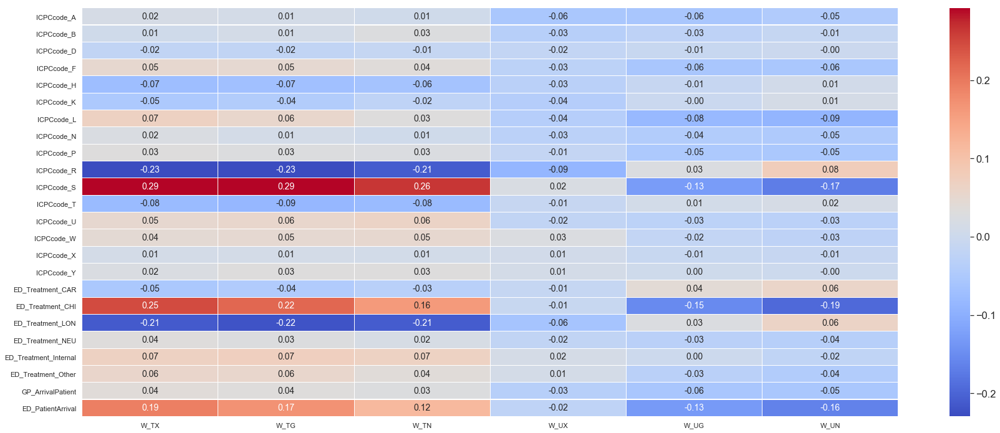

In [264]:
#Correlation for All dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))
sns.set(font_scale=1.5)

hm = sns.heatmap(df.corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('GP_Corr_Weather.jpeg')

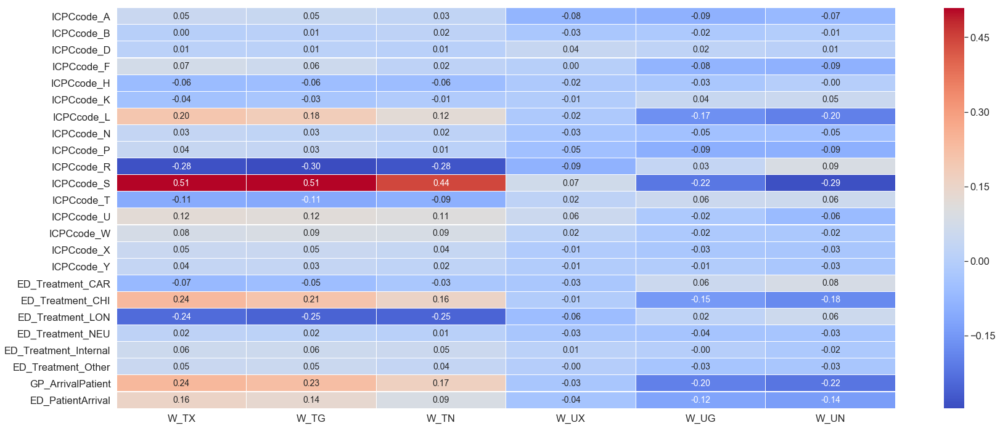

In [265]:
#Correlation for only weekdays and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))
sns.set(font_scale=1.5)

hm = sns.heatmap(df[(df['Is_Weekday']==1) & (df['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('all_weekdays.jpeg')

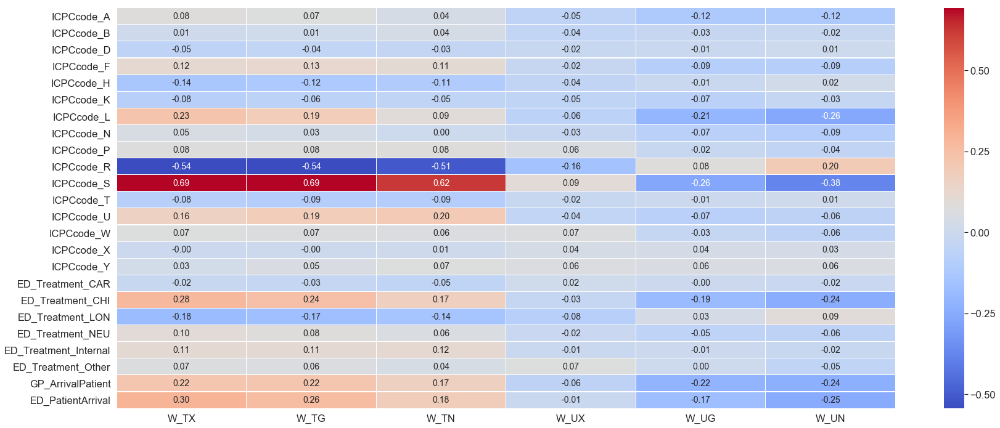

In [266]:
#Correlation for only weekend and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))
sns.set(font_scale=1.5)

hm = sns.heatmap(df[(df['Is_Weekday']==0) & (df['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('all_weekends.jpeg')

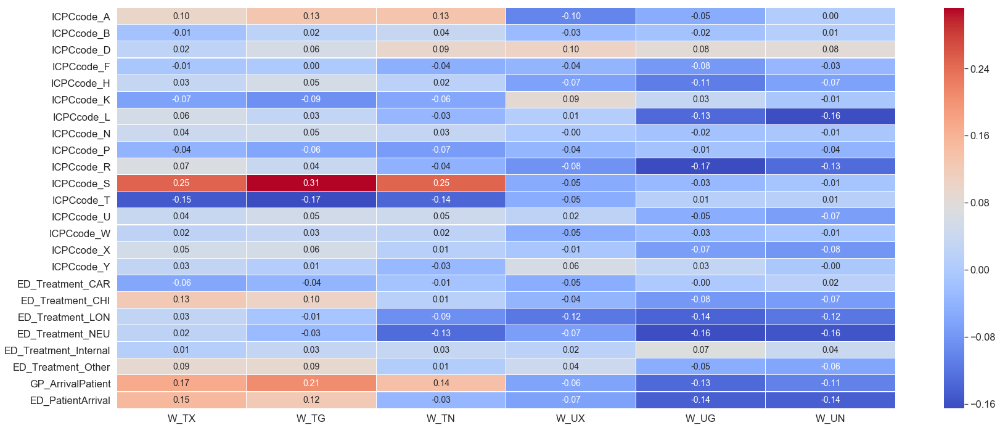

In [267]:
#Correlation for only weekdays and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))

hm = sns.heatmap(df_summer[(df_summer['Is_Weekday']==1) & (df_summer['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('summer_weekdays.jpeg')

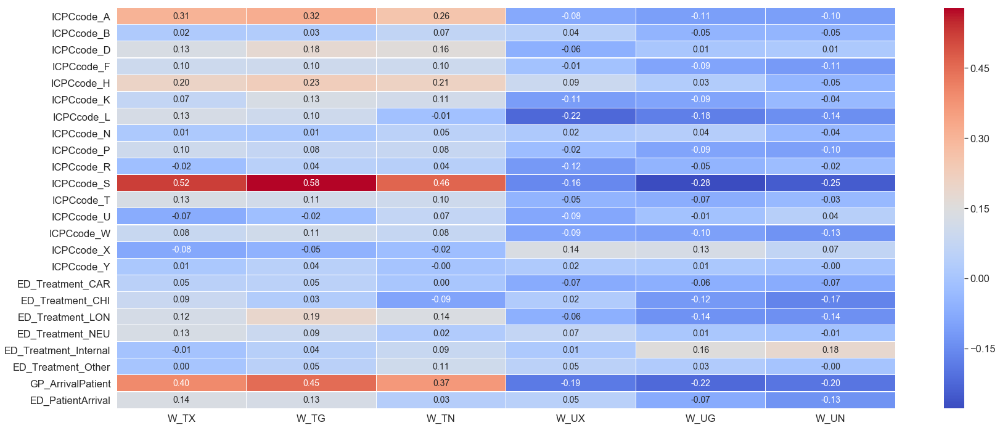

In [268]:
#Correlation for only weekends and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))

hm = sns.heatmap(df_summer[(df_summer['Is_Weekday']==0) & (df_summer['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('summer_weekends.jpeg')

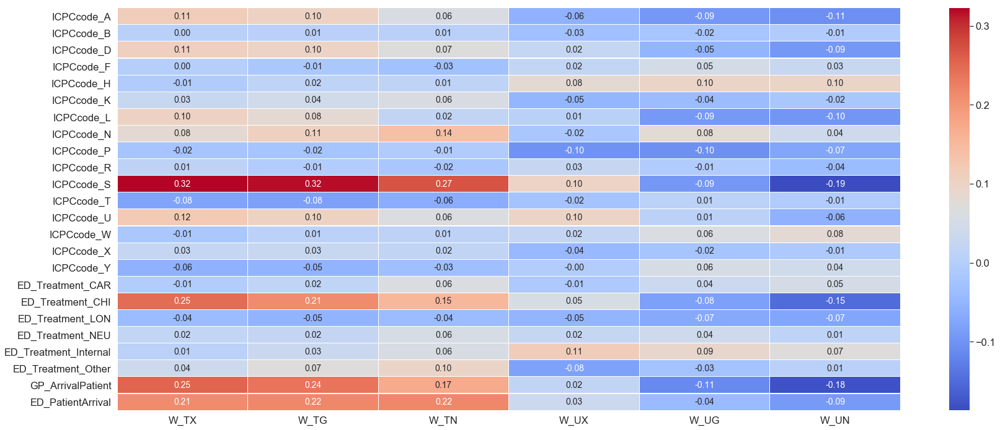

In [269]:
#Correlation for only weekdays and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))

hm = sns.heatmap(df_autumn[(df_autumn['Is_Weekday']==1) & (df_autumn['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('autumn_weekday.jpeg')

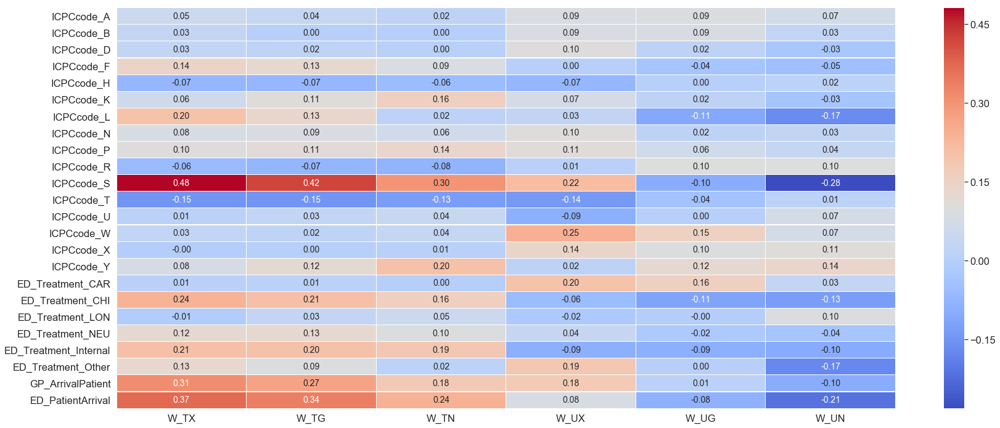

In [270]:
#Correlation for only weekends and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))

hm = sns.heatmap(df_autumn[(df_autumn['Is_Weekday']==0) & (df_autumn['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('autumn_weekends.jpeg')

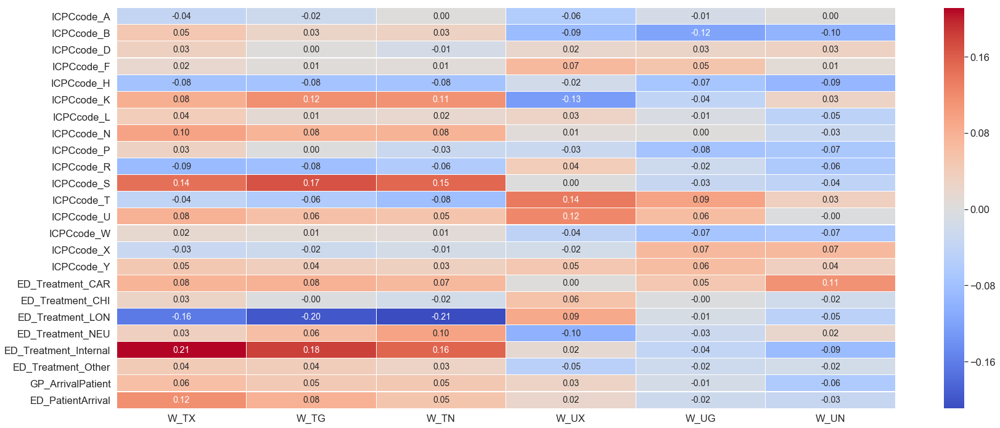

In [271]:
#Correlation for only weekdays and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))

hm = sns.heatmap(df_winter[(df_winter['Is_Weekday']==1) & (df_winter['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('winter_weekday.jpeg')

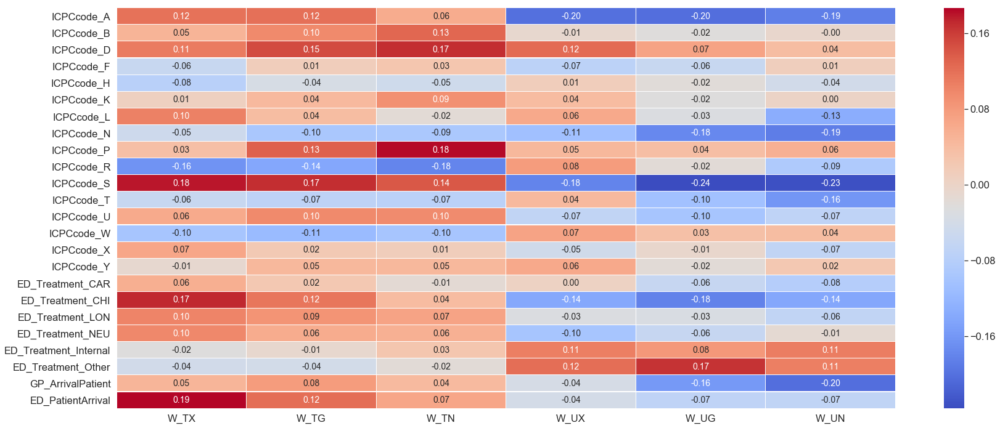

In [272]:
#Correlation for only weekends and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))

hm = sns.heatmap(df_winter[(df_winter['Is_Weekday']==0) & (df_winter['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('winter_weekend.jpeg')

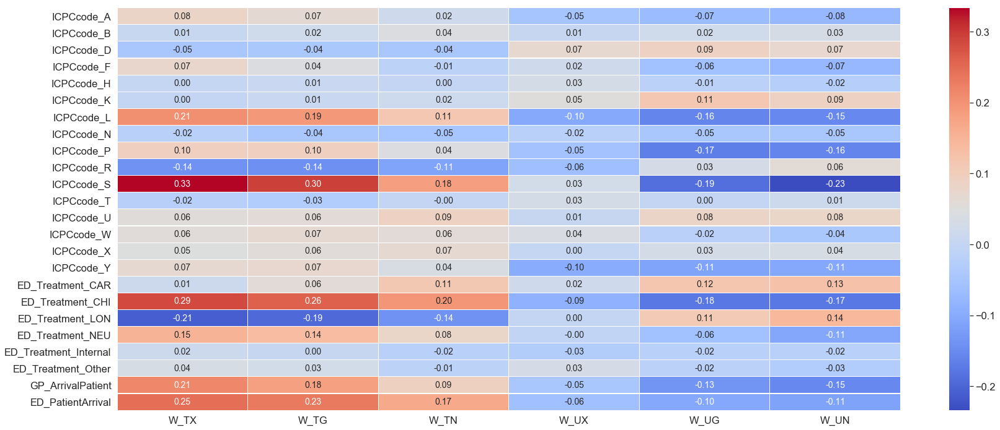

In [273]:
#Correlation for only weekdays and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))

hm = sns.heatmap(df_spring[(df_spring['Is_Weekday']==1) & (df_spring['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('spring_weekday.jpeg')

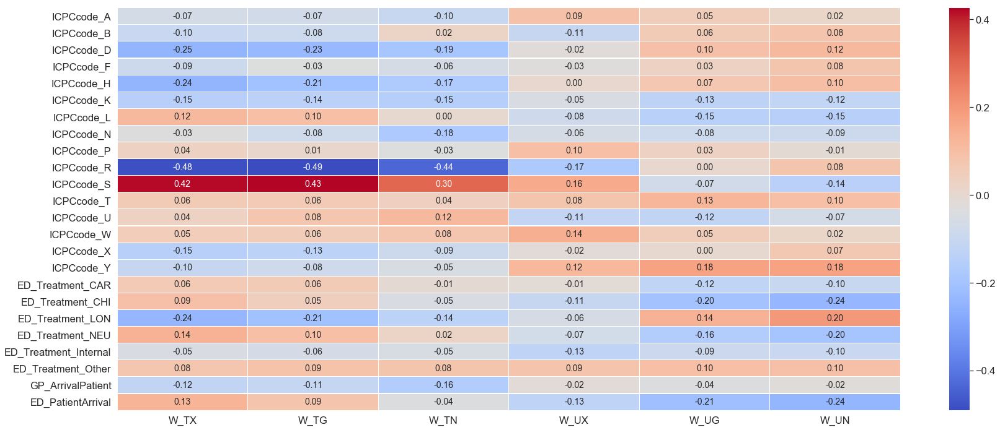

In [274]:
#Correlation for only weekends and Non-holiday dates
fig, (ax) = plt.subplots(1, 1, figsize=(25,10))

hm = sns.heatmap(df_spring[(df_spring['Is_Weekday']==0) & (df_spring['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['W_TX', 'W_TG','W_TN','W_UX', 'W_UG','W_UN']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('spring_weekend.jpeg')

-------------pollen---------------

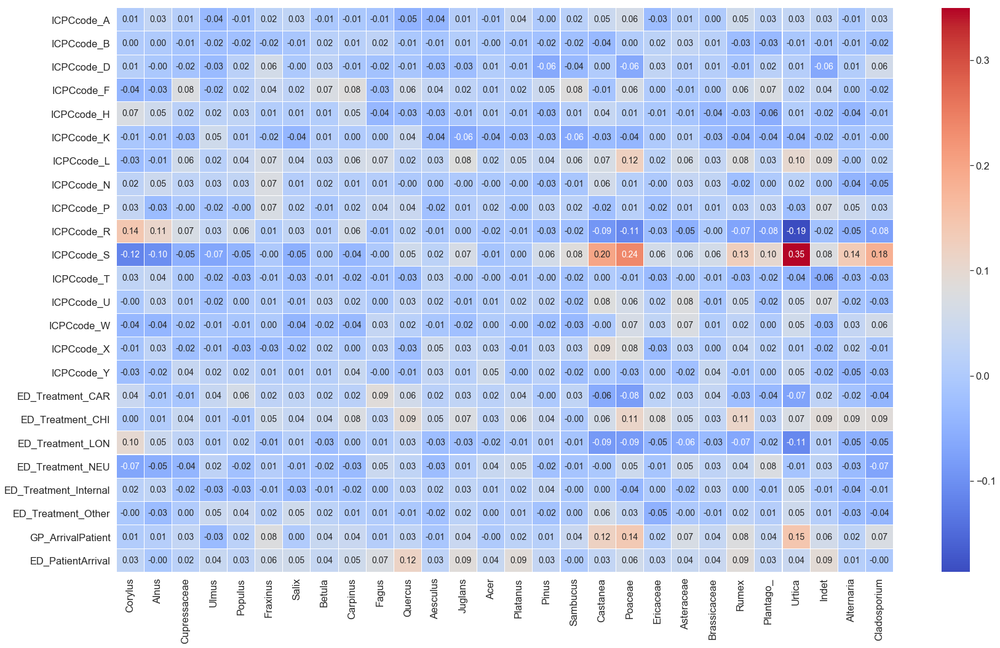

In [275]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df[(df['Is_Weekday']==1) & (df['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_allweekdays.jpeg')

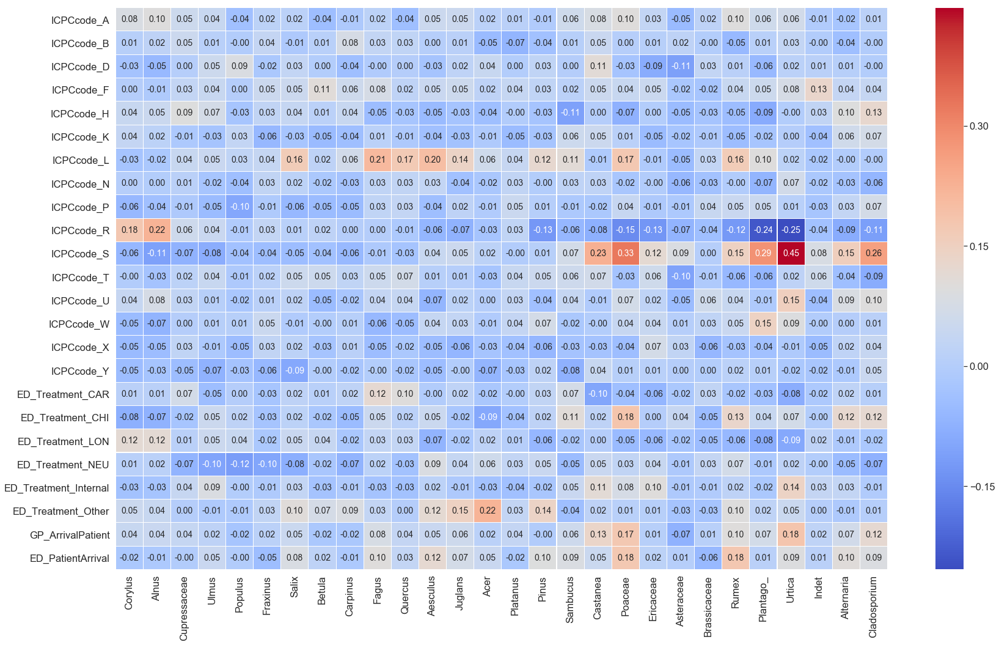

In [276]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df[(df['Is_Weekday']==0) & (df['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_allweekends.jpeg')

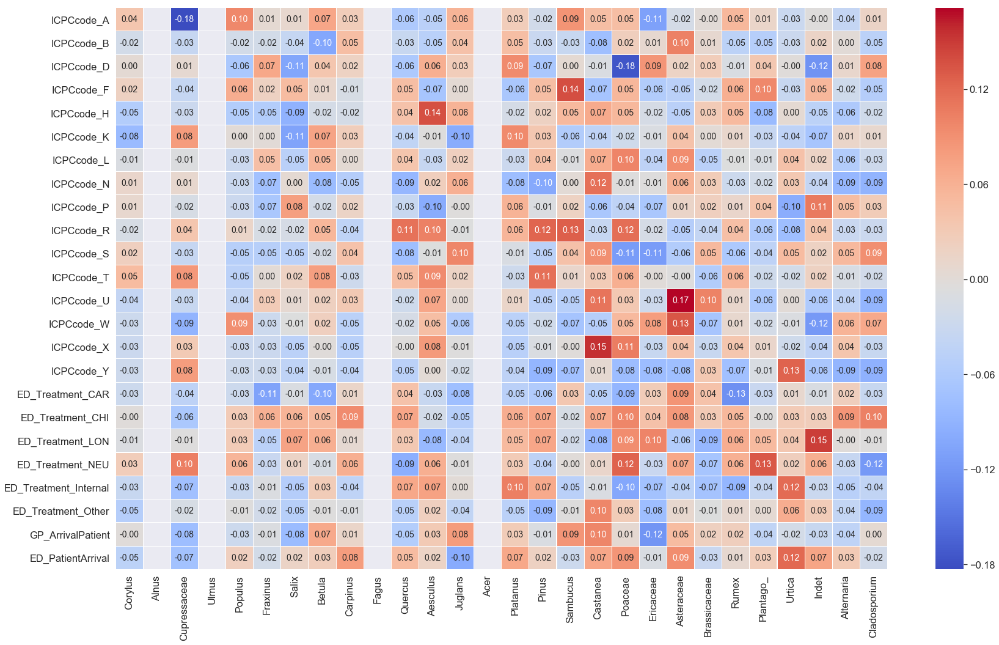

In [277]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df_summer[(df_summer['Is_Weekday']==1) & (df_summer['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_summer_weekdays.jpeg')

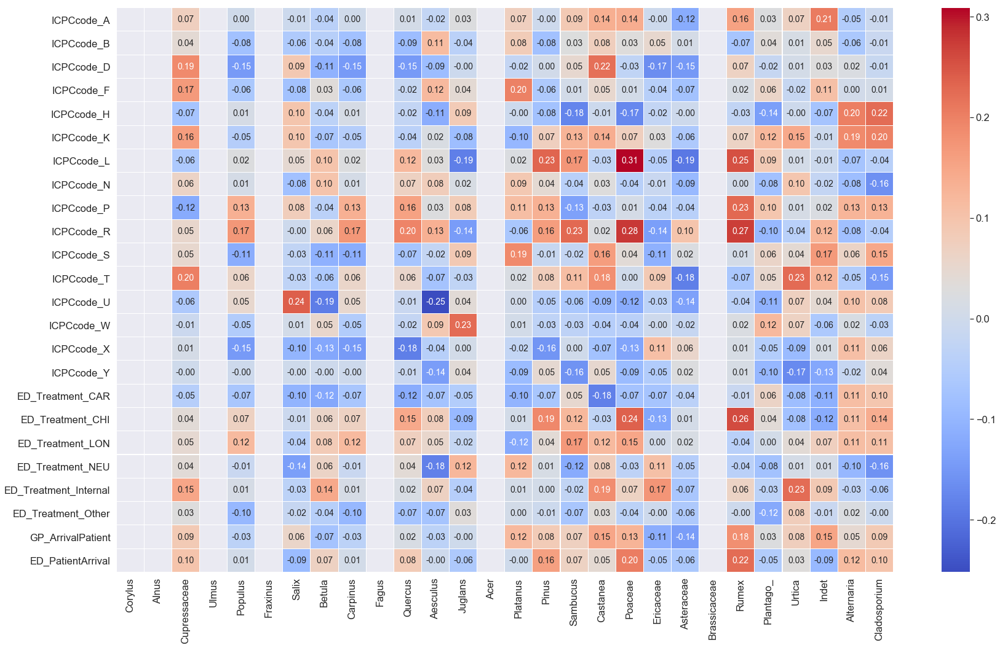

In [278]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df_summer[(df_summer['Is_Weekday']==0) & (df_summer['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_summer_weekends.jpeg')

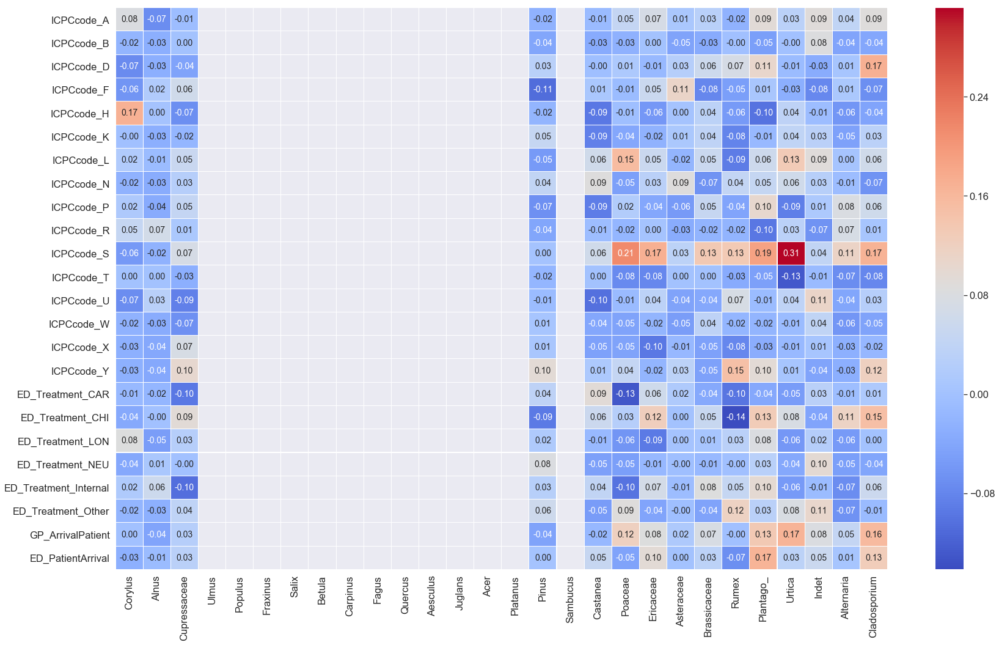

In [279]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df_autumn[(df_autumn['Is_Weekday']==1) & (df_autumn['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_autumn_weekdays.jpeg')

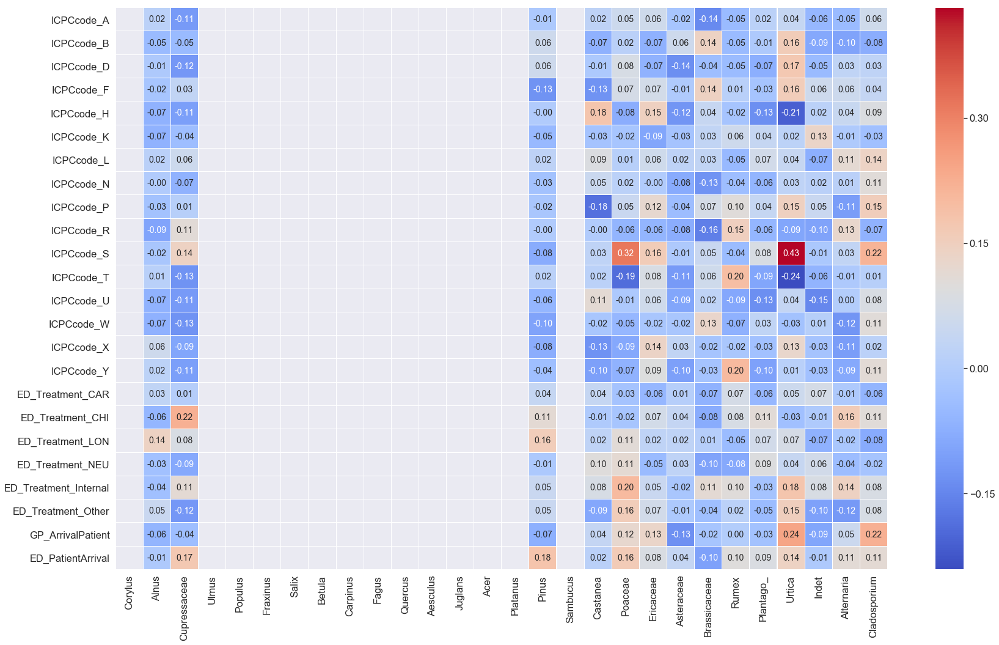

In [280]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df_autumn[(df_autumn['Is_Weekday']==0) & (df_autumn['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_autumn_weekends.jpeg')

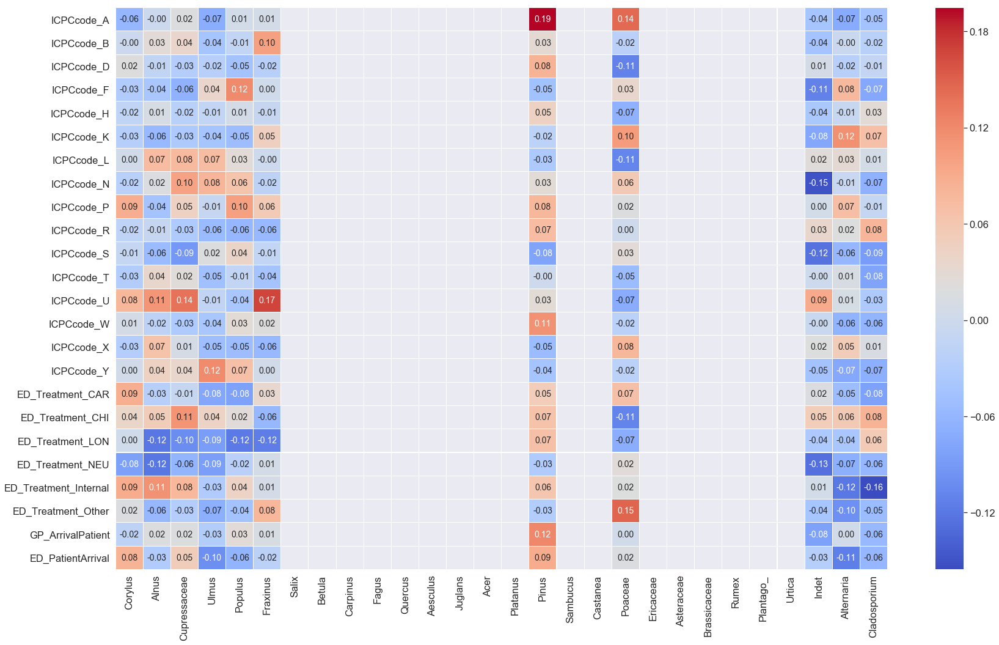

In [281]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df_winter[(df_winter['Is_Weekday']==1) & (df_winter['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_winter_weekdays.jpeg')

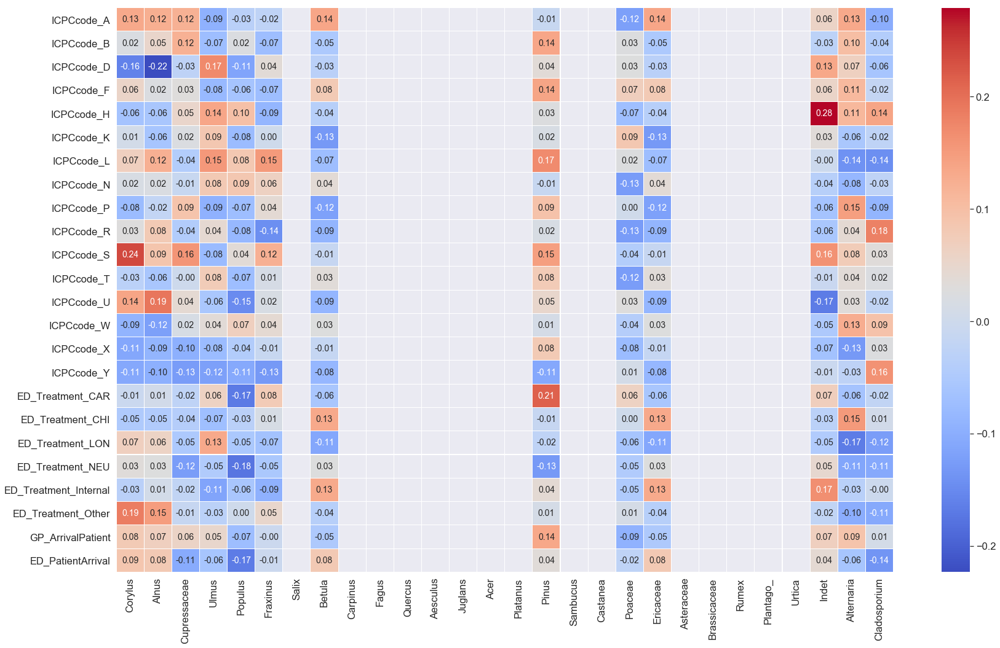

In [282]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df_winter[(df_winter['Is_Weekday']==0) & (df_winter['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_winter_weekdends.jpeg')

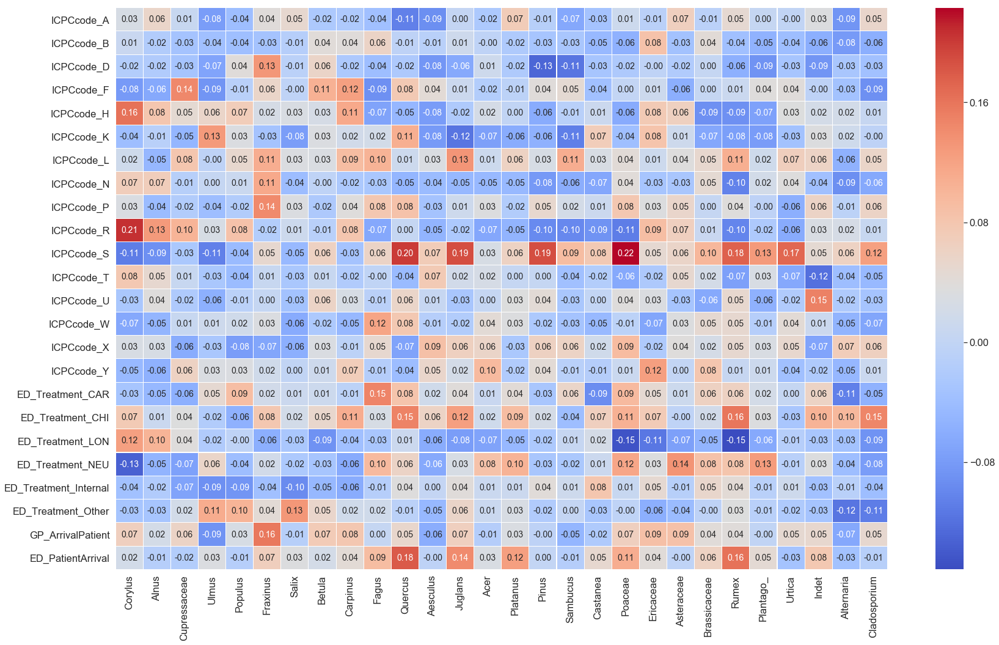

In [283]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df_spring[(df_spring['Is_Weekday']==1) & (df_spring['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_spring_weekdays.jpeg')

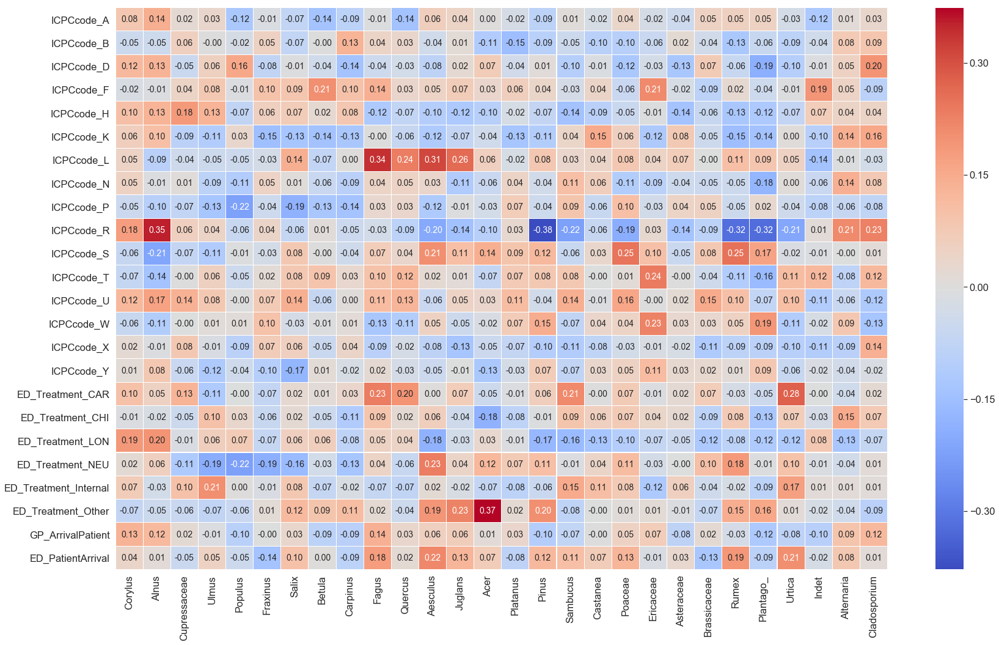

In [284]:
#Pollen Correlation all days
fig, (ax) = plt.subplots(1, 1, figsize=(25,15))

hm = sns.heatmap(df_spring[(df_spring['Is_Weekday']==0) & (df_spring['Is_Holiday']==0)].corr().loc[['ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
                               'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
                               'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
                               'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
                               'ED_Treatment_CAR', 'ED_Treatment_CHI', 'ED_Treatment_LON',
                               'ED_Treatment_NEU', 'ED_Treatment_Internal', 'ED_Treatment_Other', 'GP_ArrivalPatient','ED_PatientArrival'],
                               ['Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
                               'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
                               'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 'Pinus',
                                'Sambucus', 'Castanea', 'Poaceae', 'Ericaceae', 'Asteraceae',
                               'Brassicaceae', 'Rumex', 'Plantago_', 'Urtica', 
                               'Indet', 'Alternaria', 'Cladosporium']], 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 fmt='.2f',       # String formatting code to use when adding annotations.
                 annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.95)
#fig.suptitle('Wine Attributes Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
#fig.savefig('pollen_spring_weekends.jpeg')

-----------------Forecasting number of ED_Output_Admittance with Regression-------------

In [285]:
df.columns.values

array(['GP_ArrivalPatient', 'C_Consult', 'C_overig', 'C_Telefonisch',
       'C_Visite', 'GP_Post_Age_0-4_year', 'GP_Post_Age_5-19_year',
       'GP_Post_Age_20-65_year', 'GP_Post_Age_66-74_year',
       'GP_Post_Age_75_plus', 'U0', 'U1', 'U2', 'U3', 'U4', 'U5',
       'ICPCcode_A', 'ICPCcode_B', 'ICPCcode_D', 'ICPCcode_F',
       'ICPCcode_H', 'ICPCcode_K', 'ICPCcode_L', 'ICPCcode_N',
       'ICPCcode_P', 'ICPCcode_R', 'ICPCcode_S', 'ICPCcode_T',
       'ICPCcode_U', 'ICPCcode_W', 'ICPCcode_X', 'ICPCcode_Y',
       'ICPCcode_Z', 'W_DDVEC', 'W_FHVEC', 'W_FG', 'W_FHX', 'W_FHXH',
       'W_FHN', 'W_FHNH', 'W_FXX', 'W_FXXH', 'W_TG', 'W_TN', 'W_TNH',
       'W_TX', 'W_TXH', 'W_T10N', 'W_T10NH', 'W_SQ', 'W_SP', 'W_Q',
       'W_DR', 'W_RH', 'W_RHX', 'W_RHXH', 'W_UG', 'W_UX', 'W_UXH', 'W_UN',
       'W_UNH', 'W_EV24', 'Corylus', 'Alnus', 'Cupressaceae', 'Ulmus',
       'Populus', 'Fraxinus', 'Salix', 'Betula', 'Carpinus', 'Fagus',
       'Quercus', 'Aesculus', 'Juglans', 'Acer', 'Platanus', 

In [286]:
#Normalization
scaler = MinMaxScaler()
df_Scaled_1 = scaler.fit_transform(df.loc[:,'GP_ArrivalPatient':'ED_Urgency_Rood'])
df_Scaled_1 = pd.DataFrame(df_Scaled_1, columns=df.loc[:,'GP_ArrivalPatient':'ED_Urgency_Rood'].columns)
df_Scaled_1.set_index(df.index, inplace=True)
df_Scaled = pd.concat([df_Scaled_1, df.loc[:,'Is_Holiday':'GP_Post_WH_Opening']], axis=1)

C:\Anaconda\lib\site-packages\sklearn\preprocessing\data.py:334: DataConversionWarning:

Data with input dtype int64 were all converted to float64 by MinMaxScaler.



In [287]:
#Shifting/Lagging values
for col in df_Scaled:
    for i in range(1,7):
        df_Scaled["%s-%d" % (col,i)]=df_Scaled[[col]].shift(periods=i).copy()

In [288]:
df_Scaled.shape

(1826, 973)

In [289]:
df_Scaled.dropna(inplace=True)

In [290]:
df_Scaled.head(3)

,GP_ArrivalPatient,C_Consult,C_overig,C_Telefonisch,C_Visite,GP_Post_Age_0-4_year,GP_Post_Age_5-19_year,GP_Post_Age_20-65_year,GP_Post_Age_66-74_year,GP_Post_Age_75_plus,...,Is_Spring-3,Is_Spring-4,Is_Spring-5,Is_Spring-6,GP_Post_WH_Opening-1,GP_Post_WH_Opening-2,GP_Post_WH_Opening-3,GP_Post_WH_Opening-4,GP_Post_WH_Opening-5,GP_Post_WH_Opening-6
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-07,0.135246,0.106061,0.000000,0.155963,0.303030,0.166667,0.111111,0.122137,0.138889,0.186441,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2013-01-08,0.102459,0.075758,0.000000,0.174312,0.121212,0.095238,0.166667,0.106870,0.083333,0.118644,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-09,0.069672,0.083333,0.166667,0.091743,0.090909,0.190476,0.185185,0.053435,0.055556,0.033898,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [291]:
X = pd.concat([df_Scaled.loc[:,'Is_Holiday':'GP_Post_WH_Opening'],
                    df_Scaled.loc[:,'GP_ArrivalPatient-1':'GP_Post_WH_Opening-3']], axis=1)
Y = df[['ED_Output_Admittance']].loc['2013-01-07':].copy()

In [292]:
X.head(5)

,Is_Holiday,Is_Weekday,Is_Summer,Is_Autumn,Is_Winter,Is_Spring,GP_Post_WH_Opening,GP_ArrivalPatient-1,GP_ArrivalPatient-2,GP_ArrivalPatient-3,...,Is_Winter-6,Is_Spring-1,Is_Spring-2,Is_Spring-3,Is_Spring-4,Is_Spring-5,Is_Spring-6,GP_Post_WH_Opening-1,GP_Post_WH_Opening-2,GP_Post_WH_Opening-3
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-07,0,1,0,0,1,0,0,0.536885,0.733607,0.176230,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-08,0,1,0,0,1,0,0,0.135246,0.536885,0.733607,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-09,0,1,0,0,1,0,0,0.102459,0.135246,0.536885,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-10,0,1,0,0,1,0,0,0.069672,0.102459,0.135246,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-11,0,1,0,0,1,0,0,0.077869,0.069672,0.102459,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [293]:
X.shape

(1820, 838)

In [294]:
Y.head(5)

,ED_Output_Admittance
Date,
2013-01-07,14
2013-01-08,15
2013-01-09,14
2013-01-10,8
2013-01-11,15


In [295]:
Y.shape

(1820, 1)

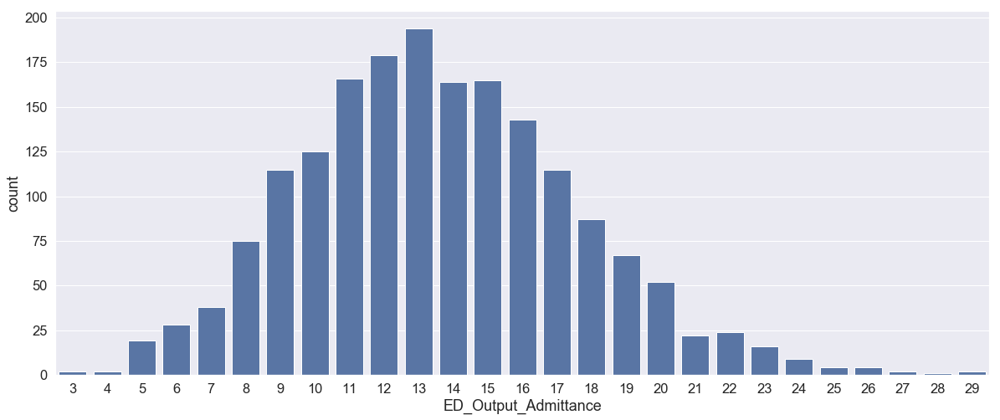

In [296]:
sns.countplot(x='ED_Output_Admittance', data=Y, color="b")

In [297]:
validation_size = 0.20
seed = 7
num_folds = 10
X_train, X_validation, Y_train, Y_validation = train_test_split(X, Y, test_size=validation_size, random_state=seed)
scoring_list = ['neg_mean_absolute_error']

In [298]:
X_train.shape

(1456, 838)

In [299]:
X_validation.shape

(364, 838)

In [300]:
Y_train.shape

(1456, 1)

In [301]:
Y_validation.shape

(364, 1)

In [302]:
# Spot-Check Algorithms
models = []
models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVR', SVR()))

In [303]:
Training_Error_Result=[]
for name, model in models:
    kfold = KFold(n_splits=num_folds, random_state=seed)
    for scoring in scoring_list:
        cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
        #results.append(cv_results)
        #names.append(name)
        Training_Error_Result.append ("%s %s: %f (Standard Deviation: %f)" % (name, scoring, cv_results.mean(), cv_results.std()))

C:\Anaconda\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Anaconda\lib\site-packages\sklearn\svm\base.py:196: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.

C:\Anaconda\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Anaconda\lib\site-packages\sklearn\svm\base.py:196: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.

C:\Anaconda\lib\site-packages\sklearn\utils\va

In [304]:
Training_Error_Result

['LR neg_mean_absolute_error: -6474372738.837606 (Standard Deviation: 7608792175.380759)',
 'LASSO neg_mean_absolute_error: -3.159437 (Standard Deviation: 0.183573)',
 'EN neg_mean_absolute_error: -3.156827 (Standard Deviation: 0.184007)',
 'KNN neg_mean_absolute_error: -3.173385 (Standard Deviation: 0.182558)',
 'CART neg_mean_absolute_error: -4.105205 (Standard Deviation: 0.390805)',
 'SVR neg_mean_absolute_error: -3.048350 (Standard Deviation: 0.180831)']

In [305]:
Testing_Error_Result=[]
for name, model in models:
    Forecasting_Model = model
    Forecasting_Model.fit(X_train, Y_train)
    MAE = mean_absolute_error (Y_validation, Forecasting_Model.predict(X_validation))
    Testing_Error_Result.append ("%s %s: %f" % (name, scoring, MAE))

C:\Anaconda\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Anaconda\lib\site-packages\sklearn\svm\base.py:196: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



In [306]:
Testing_Error_Result

['LR neg_mean_absolute_error: 4.740106',
 'LASSO neg_mean_absolute_error: 3.260778',
 'EN neg_mean_absolute_error: 3.256795',
 'KNN neg_mean_absolute_error: 3.231868',
 'CART neg_mean_absolute_error: 4.332418',
 'SVR neg_mean_absolute_error: 3.122319']

In [307]:
Selected_Model = ElasticNet()
Selected_Model.fit(X_train, Y_train)

ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [308]:
Coef = pd.concat([pd.DataFrame(X_train.columns, columns=['Features']),
                             pd.DataFrame(Selected_Model.coef_, columns=['Coef_Value'])],axis=1)

In [309]:
Coef[Coef['Coef_Value']!=0]

,Features,Coef_Value
1,Is_Weekday,0.030646


In [310]:
LR_model = LinearRegression()
LR_model.fit(X_train[['Is_Weekday']], Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [311]:
mean_absolute_error(Y_train, LR_model.predict(X_train[['Is_Weekday']]))

3.025629299348962

In [312]:
mean_absolute_error(Y_validation, LR_model.predict(X_validation[['Is_Weekday']]))

3.0569122294670024

In [313]:
LR_model.coef_

array([[2.55938335]])

In [314]:
LR_model.intercept_

array([11.76626506])